# What is CAPM ?


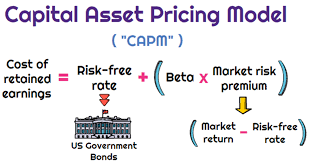

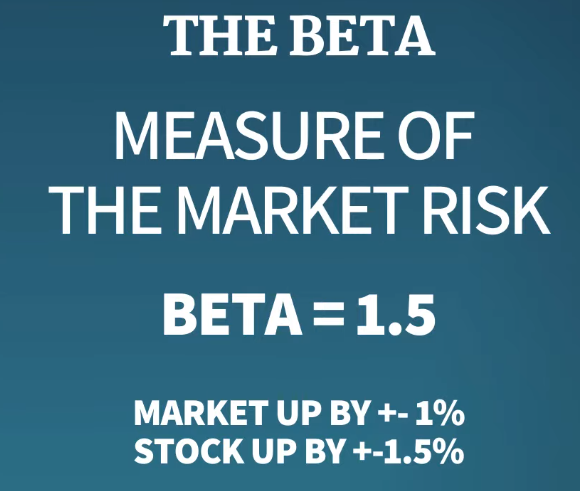

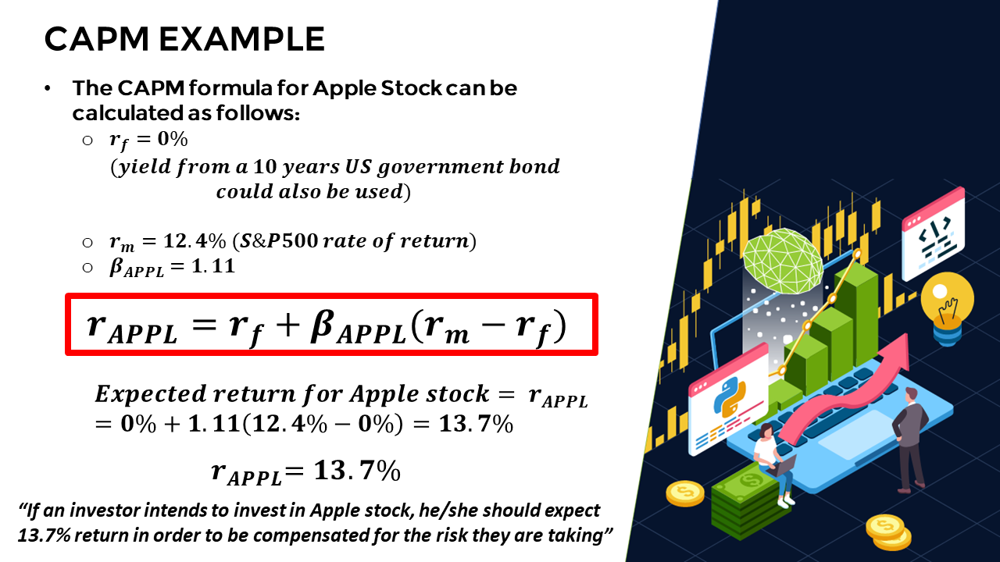

In [2]:
import pandas as pd
import seaborn as sns
import plotly.express as px
from copy import copy
from scipy import stats
import matplotlib.pyplot as plt
import numpy as np
import plotly.figure_factory as ff
import plotly.graph_objects as go
     

E:\anaconda\Lib\site-packages\paramiko\transport.py:219: CryptographyDeprecationWarning: Blowfish has been deprecated
  "class": algorithms.Blowfish,


In [25]:
stocks_df = pd.read_csv('CAPM/latest_stocks.csv')

In [27]:
stocks_df.dtypes

Unnamed: 0       int64
Date            object
Natural_Gas    float64
Crude_oil      float64
Copper         float64
Bitcoin         object
Platinum        object
Ethereum        object
S&P_500         object
Nasdaq_100      object
Apple          float64
Tesla          float64
Microsoft      float64
Silver         float64
Google         float64
Nvidia         float64
Berkshire       object
Netflix        float64
Amazon         float64
Meta           float64
Gold            object
dtype: object

In [36]:
stocks_df = pd.read_csv('CAPM/latest_stocks.csv')

# Remove commas and convert each column to float64, except the first two columns
for column in stocks_df.columns[2:]:
    # Replace commas with empty string and convert to float
    stocks_df[column] = stocks_df[column].astype(str).str.replace(',', '').astype(float)


In [37]:
stocks_df.dtypes

Unnamed: 0       int64
Date            object
Natural_Gas    float64
Crude_oil      float64
Copper         float64
Bitcoin        float64
Platinum       float64
Ethereum       float64
S&P_500        float64
Nasdaq_100     float64
Apple          float64
Tesla          float64
Microsoft      float64
Silver         float64
Google         float64
Nvidia         float64
Berkshire      float64
Netflix        float64
Amazon         float64
Meta           float64
Gold           float64
dtype: object

In [68]:
stocks_df = stocks_df.drop(stocks_df.columns[0], axis=1)

In [69]:
stocks_df

,Date,Natural_Gas,Crude_oil,Copper,Bitcoin,Platinum,Ethereum,S&P_500,Nasdaq_100,Apple,Tesla,Microsoft,Silver,Google,Nvidia,Berkshire,Netflix,Amazon,Meta,Gold
826,1/10/2020,2.527,38.72,2.8655,10620.5,906.0,353.07,3380.80,11583.20,116.79,149.39,212.46,24.254,74.39,136.15,318600.0,527.51,161.06,266.63,1916.3
580,1/10/2021,5.619,75.88,4.1885,48146.0,973.6,3309.13,4357.05,14791.87,142.65,258.41,289.10,22.536,136.54,207.42,414878.0,613.15,164.16,343.01,1758.4
559,1/11/2021,5.186,84.05,4.3790,60915.3,1068.1,4320.85,4613.67,15905.28,148.96,402.86,329.37,24.073,143.50,258.27,430944.0,681.17,165.91,329.98,1795.8
314,1/11/2022,5.714,88.37,3.4570,20483.5,950.5,1579.64,3856.10,11288.95,150.65,227.82,228.17,19.667,90.47,135.43,443004.0,286.75,96.79,95.20,1649.7
63,1/11/2023,3.494,80.44,3.6490,35423.8,934.9,1846.60,4237.86,14664.91,173.97,205.66,346.07,22.790,126.45,423.25,523749.0,420.19,137.00,311.85,1987.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
372,9/8/2022,7.833,90.50,3.6065,23146.7,934.2,1702.80,4122.47,13008.17,164.92,283.33,282.30,20.482,116.63,170.86,440058.0,229.94,137.83,168.53,1812.3
122,9/8/2023,2.959,84.40,3.7835,29578.0,892.7,1855.36,4467.71,15101.71,178.19,242.19,322.23,22.731,129.66,425.54,545280.0,428.90,137.85,305.21,1950.6
842,9/9/2020,2.406,38.05,3.0460,10224.6,930.7,351.10,3398.96,11395.85,117.32,122.09,211.29,27.083,77.36,127.15,329760.0,500.19,163.43,273.72,1954.9
596,9/9/2021,5.031,68.14,4.2840,46385.6,977.5,3423.51,4493.28,15561.05,154.07,251.62,297.25,24.177,143.54,221.77,420285.0,597.54,174.21,378.00,1800.0


In [70]:
stocks_df = stocks_df.sort_values(by = ['Date'])
stocks_df
     

,Date,Natural_Gas,Crude_oil,Copper,Bitcoin,Platinum,Ethereum,S&P_500,Nasdaq_100,Apple,Tesla,Microsoft,Silver,Google,Nvidia,Berkshire,Netflix,Amazon,Meta,Gold
826,1/10/2020,2.527,38.72,2.8655,10620.5,906.0,353.07,3380.80,11583.20,116.79,149.39,212.46,24.254,74.39,136.15,318600.0,527.51,161.06,266.63,1916.3
580,1/10/2021,5.619,75.88,4.1885,48146.0,973.6,3309.13,4357.05,14791.87,142.65,258.41,289.10,22.536,136.54,207.42,414878.0,613.15,164.16,343.01,1758.4
559,1/11/2021,5.186,84.05,4.3790,60915.3,1068.1,4320.85,4613.67,15905.28,148.96,402.86,329.37,24.073,143.50,258.27,430944.0,681.17,165.91,329.98,1795.8
314,1/11/2022,5.714,88.37,3.4570,20483.5,950.5,1579.64,3856.10,11288.95,150.65,227.82,228.17,19.667,90.47,135.43,443004.0,286.75,96.79,95.20,1649.7
63,1/11/2023,3.494,80.44,3.6490,35423.8,934.9,1846.60,4237.86,14664.91,173.97,205.66,346.07,22.790,126.45,423.25,523749.0,420.19,137.00,311.85,1987.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
372,9/8/2022,7.833,90.50,3.6065,23146.7,934.2,1702.80,4122.47,13008.17,164.92,283.33,282.30,20.482,116.63,170.86,440058.0,229.94,137.83,168.53,1812.3
122,9/8/2023,2.959,84.40,3.7835,29578.0,892.7,1855.36,4467.71,15101.71,178.19,242.19,322.23,22.731,129.66,425.54,545280.0,428.90,137.85,305.21,1950.6
842,9/9/2020,2.406,38.05,3.0460,10224.6,930.7,351.10,3398.96,11395.85,117.32,122.09,211.29,27.083,77.36,127.15,329760.0,500.19,163.43,273.72,1954.9
596,9/9/2021,5.031,68.14,4.2840,46385.6,977.5,3423.51,4493.28,15561.05,154.07,251.62,297.25,24.177,143.54,221.77,420285.0,597.54,174.21,378.00,1800.0


In [71]:
def normalize(df):
    # Copy the dataframe to avoid modifying the original data
    df_normalized = df.copy()

    # Normalize prices for each stock (column)
    for column in df.columns:
        # Attempt to convert the data to float
        try:
            df_normalized[column] = df_normalized[column].astype(float)
        except ValueError:
            print(f"Cannot convert column '{column}' to numeric data type. Skipping this column.")
            continue

        # Divide each price by the first price in the series and multiply by 100
        # This results in a series where the first price is 100 and subsequent prices are
        # relative to the first price.
        df_normalized[column] = df_normalized[column] / df_normalized[column].iloc[0] * 100

    return df_normalized

In [76]:
def calculate_daily_return(df):
   
    # Copy the dataframe to avoid modifying the original data
    df_daily_return = df.copy()

    # Calculate the daily return for each stock (column)
    for column in df.columns:
        # Attempt to convert the data to float
        try:
            df_daily_return[column] = df_daily_return[column].astype(float)
        except ValueError:
            print(f"Cannot convert column '{column}' to numeric data type. Skipping this column.")
            continue
        df_daily_return[column] = (df_daily_return[column] / df_daily_return[column].shift(1) - 1) * 100

        df_daily_return = df_daily_return.fillna(0)

    return df_daily_return   


In [77]:
stocks_daily_return = calculate_daily_return(stocks_df)
stocks_daily_return

Cannot convert column 'Date' to numeric data type. Skipping this column.


,Date,Natural_Gas,Crude_oil,Copper,Bitcoin,Platinum,Ethereum,S&P_500,Nasdaq_100,Apple,Tesla,Microsoft,Silver,Google,Nvidia,Berkshire,Netflix,Amazon,Meta,Gold
826,1/10/2020,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
580,1/10/2021,122.358528,95.971074,46.169953,353.330822,7.461369,837.244739,28.876301,27.701067,22.142307,72.976772,36.072673,-7.083368,83.546176,52.346676,30.219083,16.234763,1.924749,28.646439,-8.239837
559,1/11/2021,-7.705998,10.767001,4.548168,26.522037,9.706245,30.573595,5.889765,7.527175,4.423414,55.899539,13.929436,6.820199,5.097407,24.515476,3.872464,11.093533,1.066033,-3.798723,2.126934
314,1/11/2022,10.181257,5.139798,-21.055035,-66.373801,-11.010205,-63.441452,-16.420117,-29.023884,1.134533,-43.449337,-30.725324,-18.302663,-36.954704,-47.562628,2.798507,-57.903313,-41.661142,-71.149767,-8.135650
63,1/11/2023,-38.851943,-8.973634,5.553949,72.938219,-1.641241,16.900053,9.900158,29.904996,15.479588,-9.726977,51.671999,15.879392,39.770090,212.523075,18.226698,46.535310,41.543548,227.573529,20.476450
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
372,9/8/2022,92.931034,36.131167,-15.775339,-49.990169,-4.046836,-46.163842,-6.991325,-14.041661,12.889315,19.086247,-2.091354,-11.977309,-14.812651,-15.811776,1.893346,-55.778218,-17.511521,-53.394541,4.969592
122,9/8/2023,-62.223924,-6.740331,4.907805,27.784954,-4.442304,8.959361,8.374591,16.094039,8.046325,-14.520171,14.144527,10.980373,11.172083,149.057708,23.910939,86.526920,0.014511,81.101288,7.631187
842,9/9/2020,-18.688746,-54.917062,-19.492533,-65.431740,4.256749,-81.076449,-23.921651,-24.539340,-34.160166,-49.589166,-34.428824,19.145660,-40.336264,-70.120318,-39.524648,16.621590,18.556402,-10.317486,0.220445
596,9/9/2021,109.102244,79.080158,40.643467,353.666647,5.028473,875.081173,32.195730,36.550148,31.324582,106.093865,40.683421,-10.729978,85.548087,74.416044,27.451783,19.462604,6.596096,38.097326,-7.923679


In [78]:
stocks_daily_return['Tesla']

826      0.000000
580     72.976772
559     55.899539
314    -43.449337
63      -9.726977
          ...    
372     19.086247
122    -14.520171
842    -49.589166
596    106.093865
351     19.100231
Name: Tesla, Length: 1013, dtype: float64

In [79]:
stocks_daily_return['S&P_500']

826     0.000000
580    28.876301
559     5.889765
314   -16.420117
63      9.900158
         ...    
372    -6.991325
122     8.374591
842   -23.921651
596    32.195730
351    -9.479044
Name: S&P_500, Length: 1013, dtype: float64

<Axes: xlabel='S&P_500', ylabel='Tesla'>

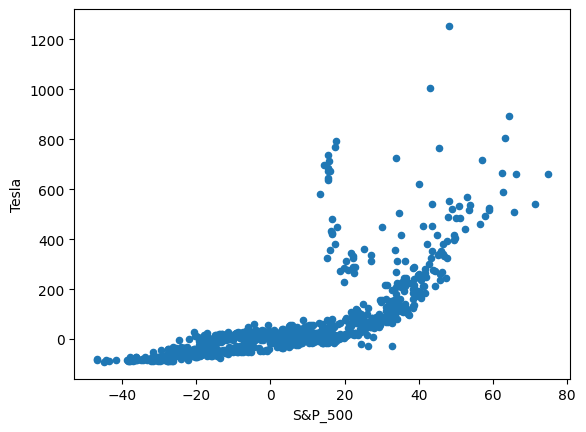

In [75]:
stocks_daily_return.plot(kind = 'scatter', x = 'S&P_500', y = 'Tesla')

In [80]:
beta, alpha = np.polyfit(stocks_daily_return['S&P_500'], stocks_daily_return['Tesla'], 1)
print('Beta for {} stock is = {} and alpha is = {}'.format('Tesla', beta, alpha))

Beta for Tesla stock is = 4.847178411091941 and alpha is = 36.360688654886644


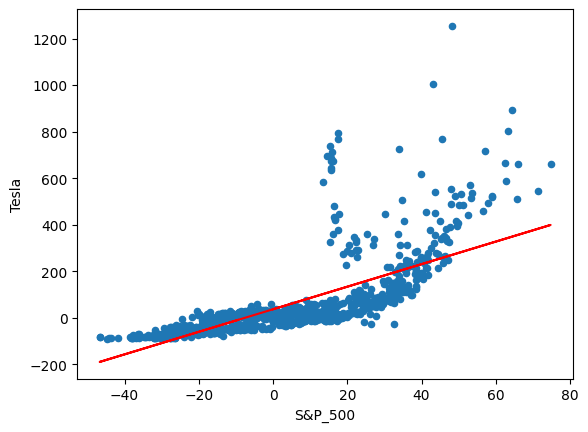

In [81]:
stocks_daily_return.plot(kind = 'scatter', x = 'S&P_500', y = 'Tesla')


# Straight line equation is y = beta * rm + alpha
plt.plot(stocks_daily_return['S&P_500'], beta * stocks_daily_return['S&P_500'] + alpha, '-', color = 'r')


In [82]:
beta

4.847178411091941

In [83]:
# Let's calculate the average daily rate of return for S&P500
stocks_daily_return['S&P_500'].mean()

2.7492528143094184

In [84]:
rm = stocks_daily_return['S&P_500'].mean() * 252
rm

692.8117092059734

In [85]:
rf = 0

# Calculate return for any security (Tesla) using CAPM
ER_Tesla = rf + ( beta * (rm-rf) )

In [86]:
ER_Tesla

3358.1819598149023

In [87]:
import numpy as np
import matplotlib.pyplot as plt

def compute_alpha_beta(stocks_daily_return):
    beta = {}
    alpha = {}

    stock_columns = [col for col in stocks_daily_return.columns if col not in ['Date', 'S&P_500']]

    for stock in stock_columns:
        stocks_daily_return.plot(kind='scatter', x='S&P_500', y=stock)
        b, a = np.polyfit(stocks_daily_return['S&P_500'], stocks_daily_return[stock], 1)
        plt.plot(stocks_daily_return['S&P_500'], b * stocks_daily_return['S&P_500'] + a, '-', color='r')
        beta[stock] = b
        alpha[stock] = a
        plt.show()

    return beta, alpha


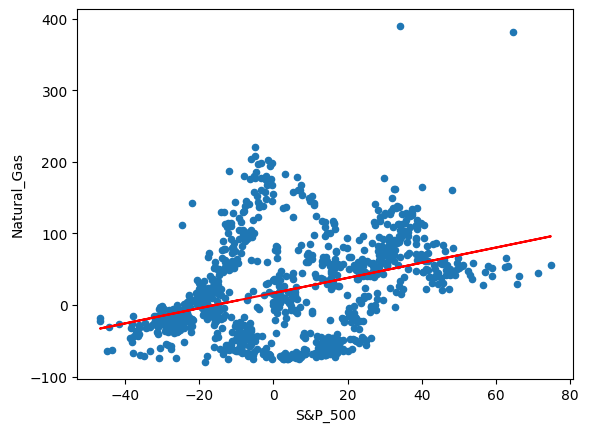

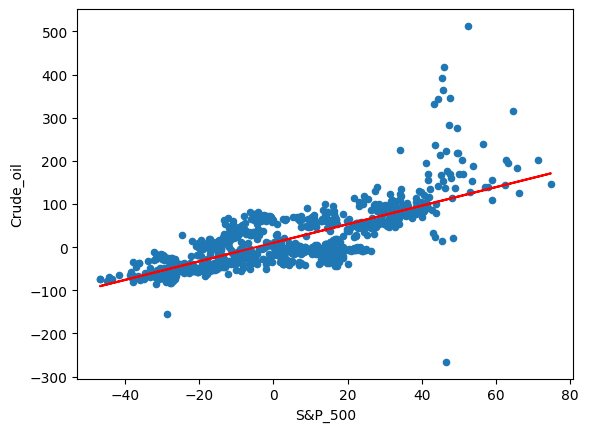

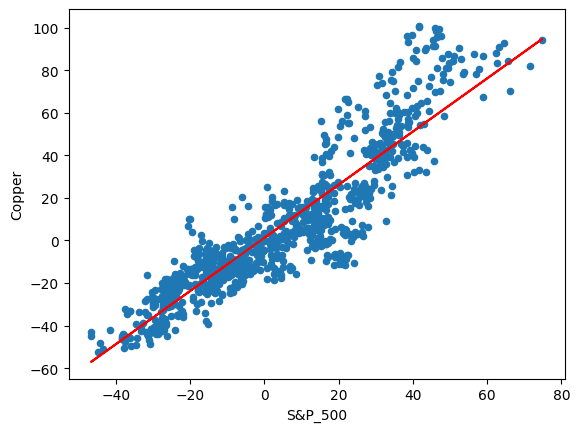

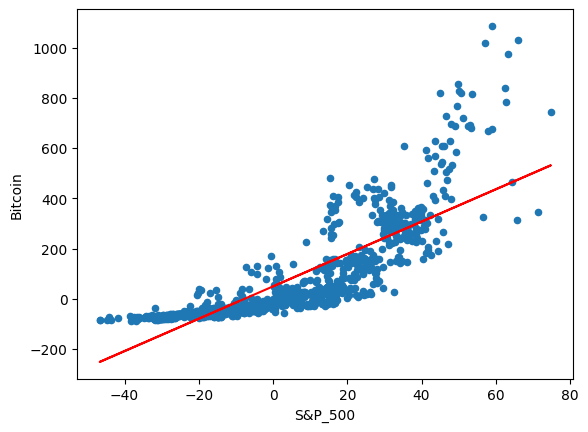

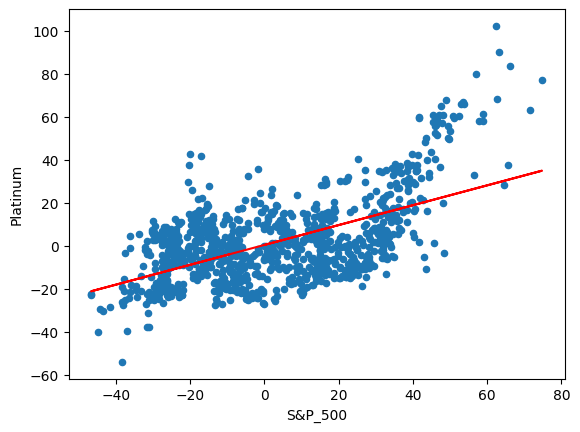

...

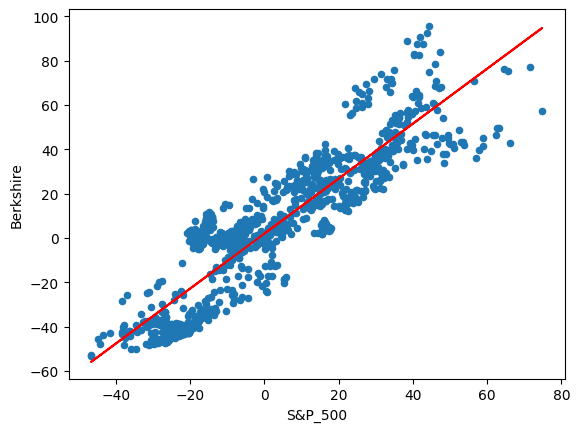

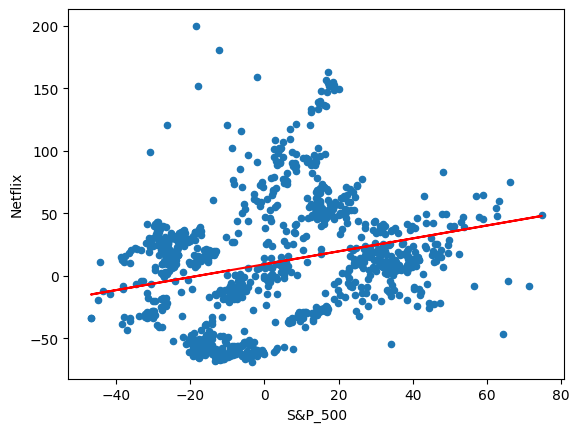

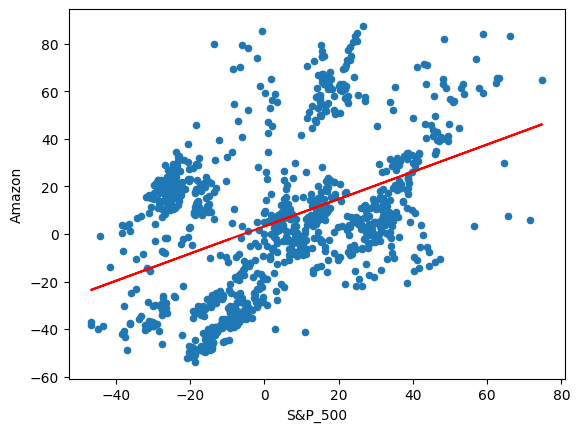

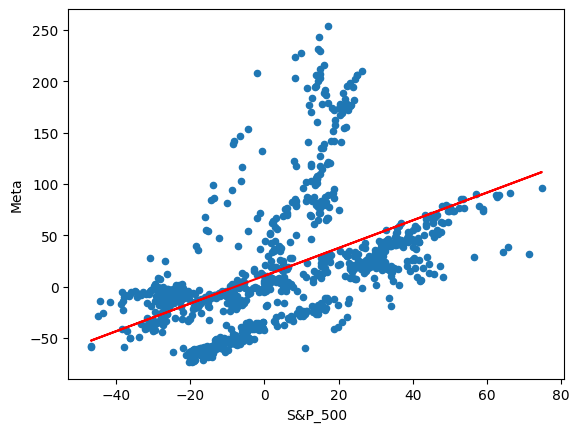

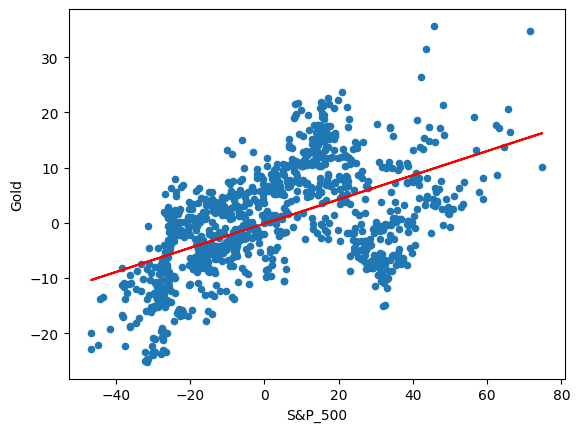

In [88]:
beta_values, alpha_values = compute_alpha_beta(stocks_daily_return)

In [89]:
alpha_values

{'Natural_Gas': 16.633049371862967,
 'Crude_oil': 10.161999665043384,
 'Copper': 1.2422813104016814,
 'Bitcoin': 49.146676047531905,
 'Platinum': 0.346635515440695,
 'Ethereum': 148.93537510202495,
 'Nasdaq_100': 1.1439764367834058,
 'Apple': 4.365715653423984,
 'Tesla': 36.360688654886644,
 'Microsoft': 2.7587262946765394,
 'Silver': 0.9994075487845165,
 'Google': 3.9282041694750807,
 'Nvidia': 35.03672036472925,
 'Berkshire': 1.9929667312833665,
 'Netflix': 9.273767734890473,
 'Amazon': 3.2210960007773695,
 'Meta': 10.59133716035118,
 'Gold': -0.13186439884250795}

In [90]:
beta_values

{'Natural_Gas': 1.0615041240561536,
 'Crude_oil': 2.152304532317476,
 'Copper': 1.2479600459033684,
 'Bitcoin': 6.443524503700195,
 'Platinum': 0.46216712537886656,
 'Ethereum': 14.36725212873504,
 'Nasdaq_100': 1.248514258001867,
 'Apple': 1.6722664351006153,
 'Tesla': 4.847178411091941,
 'Microsoft': 1.455253262181511,
 'Silver': 0.6944736026110162,
 'Google': 1.78708816197686,
 'Nvidia': 3.8012248037672545,
 'Berkshire': 1.2389007658547029,
 'Netflix': 0.5173763537494469,
 'Amazon': 0.5730769868765225,
 'Meta': 1.3506678150546219,
 'Gold': 0.2190966574855229}

In [91]:
import numpy as np

def compute_expected_returns(beta, stocks_daily_return, portfolio_weights):
    stock_symbols = list(beta.keys())
    expected_returns = {}
    risk_free_rate = 0
    market_return = stocks_daily_return['S&P_500'].mean() * 252

    for symbol in stock_symbols:
        expected_returns[symbol] = risk_free_rate + beta[symbol] * (market_return - risk_free_rate)
        print(f'Expected Return Based on CAPM for {symbol} is {expected_returns[symbol]}%')

    print()
    print()
    portfolio_return = np.sum(np.array(list(expected_returns.values())) * portfolio_weights)
    print(f'Expected Return Based on CAPM for the portfolio is {portfolio_return}%')

    return expected_returns, portfolio_return


In [94]:
portfolio_weights = np.full((18,), 1/18)

In [95]:
expected_returns, portfolio_return = compute_expected_returns(beta_values, stocks_daily_return, portfolio_weights)
     

Expected Return Based on CAPM for Natural_Gas is 735.4224865165335%
Expected Return Based on CAPM for Crude_oil is 1491.1417817666338%
Expected Return Based on CAPM for Copper is 864.6013324230778%
Expected Return Based on CAPM for Bitcoin is 4464.1492247191045%
Expected Return Based on CAPM for Platinum is 320.19479607254397%
Expected Return Based on CAPM for Ethereum is 9953.800503902083%
Expected Return Based on CAPM for Nasdaq_100 is 864.9852970543012%
Expected Return Based on CAPM for Apple is 1158.5657671498375%
Expected Return Based on CAPM for Tesla is 3358.1819598149023%
Expected Return Based on CAPM for Microsoft is 1008.2164998995413%
Expected Return Based on CAPM for Silver is 481.1394436233681%
Expected Return Based on CAPM for Google is 1238.1156040009498%
Expected Return Based on CAPM for Nvidia is 2633.5330533741326%
Expected Return Based on CAPM for Berkshire is 858.3249571283862%
Expected Return Based on CAPM for Netflix is 358.44439594390866%
Expected Return Based on

In [96]:
def interactive_plot(df, title):
   
    # Create an empty figure
    fig = px.line(title=title)

    # Loop through each stock column in the dataframe and add it to the figure
    for column in df.columns:
        # Skip the 'Date' column
        if column != 'Date':
            fig.add_scatter(x=df['Date'], y=df[column], name=column)

    # Display the figure
    fig.show()

In [97]:
interactive_plot(stocks_df, 'Prices')

In [98]:
interactive_plot(normalize(stocks_df), 'Normalized Prices')

Cannot convert column 'Date' to numeric data type. Skipping this column.


In [99]:
stocks_daily_return.mean()

C:\Users\User\AppData\Local\Temp\ipykernel_7108\2981718401.py:1: FutureWarning:

The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.



Natural_Gas     19.551393
Crude_oil       16.079229
Copper           4.673239
Bitcoin         66.861554
Platinum         1.617250
Ethereum       188.434583
S&P_500          2.749253
Nasdaq_100       4.576458
Apple            8.963199
Tesla           49.686808
Microsoft        6.759585
Silver           2.908691
Google           8.841361
Nvidia          45.487248
Berkshire        5.399018
Netflix         10.696166
Amazon           4.796630
Meta            14.304664
Gold             0.470488
dtype: float64

In [102]:
import plotly.express as px
import numpy as np

def interactive_beta_plot(df):
    
    # Loop through each stock column in the dataframe
    for column in df.columns:
        # Skip the 'Date' and 'sp500' columns
        if column != 'Date' and column != 'S&P500':

            # Create a scatter plot for the stock vs. S&P500 using Plotly Express
            fig = px.scatter(df, x='S&P_500', y=column, title=column)

            # Calculate the beta (slope) and alpha (intercept) of the line of best fit
            beta, alpha = np.polyfit(df['S&P_500'], df[column], 1)

            # Add the line of best fit to the scatter plot
            fig.add_scatter(x=df['S&P_500'], y=beta*df['S&P_500'] + alpha, mode='lines')

            # Show the figure
            fig.show()
     

In [103]:
interactive_beta_plot(stocks_daily_return)